# Data visualization, geneset scoring, and deconvolution for PDAC organoid scRNA-seq compressed screen analysis
#### _CK, BEM 08-16-2022_

### What this does:
- Loads in anndata from 1_adding_cNMF_output_and_design_matrices_to_anndata.ipynb
- Runs PCA, harmony, UMAP for data visualization
- Runs Decoupler to score cells on PROGENy and MsigDB genesets
    - Correlates signature scores with cNMF module usage
- Runs linear module deconvolution
    - Using functions from **CompressedScreen.py** and **linear_deconvolution.py**


In [1]:
import os
import sys
import warnings
import random
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import gridspec
import anndata
import multiprocess as mp
from kneed import KneeLocator
from itertools import repeat
from scipy.stats import mode
from sklearn.metrics import silhouette_score
from sklearn.covariance import MinCovDet
from sklearn.preprocessing import RobustScaler
from statsmodels.stats.weightstats import ttest_ind
from statsmodels.stats.multitest import multipletests
from scipy.stats import pearsonr,spearmanr
import decoupler as dc

pd.set_option('mode.chained_assignment', None)
warnings.simplefilter(action='ignore', category=FutureWarning)

sc.settings.verbosity = 2            # verbosity: errors (0), warnings (1), info (2), hints (3)

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
plt.rcParams["font.family"] = "Helvetica"

from CompressedScreen import *
from linear_deconvolution import *

/opt/miniconda3/envs/scanpy_env/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Define Functions

#### Hide annoying prints

In [8]:
class HiddenPrints:
    """
    Class to hide unnecessary prints
    """
    
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout

#### Decon

In [9]:
def decon(adata,decon_features,p_cutoff,k,save_prefix,num_shuff=10000,with_media=False):

    # Remove landmarks from dataset
    adata = adata[~(adata.obs.landmarks.isin(['IFNG', 'TGFbeta1', 'TNFa']))]
    
    # Get features in order
    adata = module_robust_scaler(adata,decon_features)
    features_for_deconv = adata.obs.loc[:,adata.obs.columns.isin(decon_features)]
    
    # Get metadata in order
    metadata_for_deconv = adata.obs['Metadata_perturbation']
    
    # Get design matrix in order
    if with_media:
        design_matrix_for_deconv = pd.DataFrame(adata.obsm['design_matrix_with_media'],
                                           columns = adata.uns['design_matrix_perturbations_with_media'],
                                           index = adata.obs.index)
        
        save_prefix = save_prefix + "_with_media"

    else:
        design_matrix_for_deconv = pd.DataFrame(adata.obsm['design_matrix'],
                                           columns = adata.uns['design_matrix_perturbations'],
                                           index = adata.obs.index)
    
    # Make a compressed screen object for running deconvolution
    cs = CompressedScreen(metadata_for_deconv,
                          design_matrix_for_deconv,
                          features_for_deconv)
    
    # Run deconvolution
    permute_model_coef, model_coef, pval_table=LM_shuff_test(cs, save_prefix+"_k"+k, num_shuff=num_shuff, 
                                                             p_cutoff=p_cutoff, method='elasticnet')

    model_coef.to_csv("decon_out/"+save_prefix+"_k"+k+"_model_coef.csv")
    pval_table.to_csv("decon_out/"+save_prefix+"_k"+k+"_pval_table.csv")
    permute_model_coef.to_csv("decon_out/"+save_prefix+"_k"+k+"_permute_"+str(p_cutoff)+"_model_coef.csv")

    return(permute_model_coef, pval_table, model_coef)

In [10]:
def module_robust_scaler(adata,mods_to_scale):
   
    # preserve column order in output
    cols = list(adata.obs.columns[adata.obs.columns.isin(mods_to_scale)])

    # scale - center modules to control cells, scale around all cells    
    center_to_media = RobustScaler(with_centering=True,with_scaling=False,unit_variance=False)
    scaler = RobustScaler(with_centering=False,with_scaling=True,unit_variance=True)
    
    center_to_media.fit(adata.obs.loc[adata.obs.Control == "Control", adata.obs.columns.isin(mods_to_scale)].to_numpy())
    centered = center_to_media.transform(adata.obs.loc[:,adata.obs.columns.isin(mods_to_scale)].to_numpy())

    modules_scaled = scaler.fit_transform(centered)
    modules_scaled = pd.DataFrame(modules_scaled, 
                          index = adata.obs.index, 
                          columns = cols)
    
    adata.obs.drop(mods_to_scale, axis=1, inplace=True)

    # Add to adata
    adata.obs = adata.obs.merge(modules_scaled, how='left', left_index=True, right_index=True)

    return(adata)

In [11]:
cells = ['jurkat','sw480'...]
stimulation = {'jurkat':'LPS',...}
no_stimulation = {'jurkat':'no_LPS',...}

adata

for cell in cells:
    subset_stim = adata[adata.obs['cell-type']==cell & adata.obs['stim'] = stimulation[cell]]
    subset_no_stim = adata[adata.obs['cell-type']==cell & adata.obs['stim'] = no_stimulation[cell]]
    
    subset_stim = module_robust_scaler(subset_stim, mods_to_scale)
    subset_no_stim = module_robust_scaler(subset_no_stim, mods_to_scale)
    
    subset_stim_mods = subset_stim.obs[subset_stim.obs.columns.isin(mods_to_scale)]
    subset_no_stim_mods = subset_no_stim.obs[subset_no_stim.obs.columns.isin(mods_to_scale)]
    
    adata.obs.loc[



SyntaxError: invalid syntax. Perhaps you forgot a comma? (1880167250.py, line 1)

#### Annotation helper

In [12]:
def module_annotation_helper(adata, module_table, GEP_usage = False, scale_mods = False):
    
    # Add standard set of modules
    data_path = '../1_Data/'

    # Cell cycle
    G1s_genes = [x.strip() for x in open(data_path+'marker_genes/Tirosh2014_genes/G1_s.txt')]
    G2m_genes = [x.strip() for x in open(data_path+'marker_genes/Tirosh2014_genes/G2_m.txt')]
    adata = sc.tl.score_genes_cell_cycle(adata, s_genes=G1s_genes, g2m_genes=G2m_genes, copy = True, use_raw = False)

    # PDAC Basal / Classical
    mBasal = [x.strip() for x in open(data_path+'marker_genes/PDAC_ref_genes/Moffitt-basal25.txt')]
    adata = sc.tl.score_genes(adata, mBasal, score_name='mBasal', ctrl_size=len(mBasal), copy = True, use_raw = False)

    mClassical = [x.strip() for x in open(data_path+'marker_genes/PDAC_ref_genes/Moffitt-classical25.txt')]
    adata = sc.tl.score_genes(adata, mClassical, score_name='mClassical', ctrl_size=len(mClassical), copy = True, use_raw = False)

    scIT = [x.strip() for x in open(data_path+'marker_genes/PDAC_bioRxiv/scIT.txt')]
    adata = sc.tl.score_genes(adata, scIT, score_name='scIT', ctrl_size=len(scIT), copy = True, use_raw = False)

    scOS = [x.strip() for x in open(data_path+'marker_genes/PDAC_ref_genes/scOrg_Spec.txt')]
    adata = sc.tl.score_genes(adata, scOS, score_name='scOS', ctrl_size=len(scOS), copy = True, use_raw = False)
    
    adata.obs['mBC'] = adata.obs.mClassical - adata.obs.mBasal
    
    mods = ['mBasal','mClassical', 'mBC', 'scIT', 'scOS']
    
    
    # Add custom list of modules
    if GEP_usage == False:
        for mod in module_table.columns:
            
            # module score each gene set
            adata = sc.tl.score_genes(adata, module_table.loc[:,mod].dropna(),
                                      score_name=mod, ctrl_size=len(module_table.loc[:,mod]),
                                      copy = True, use_raw = False)
            
    else:
    
        # add usages
        module_table = module_table.add_prefix('GEP_')
        adata.obs = adata.obs.merge(module_table, how='left', left_index=True, right_index=True)
    
    # scale - center modules to control cells, and scale around all cells    
    if scale_mods == True:
        mods_to_scale = mods+list(module_table.columns.values)
        adata = module_robust_scaler(adata,mods_to_scale)
        
    return(adata)

In [13]:
# Find knee for PCA plot
def get_knee_PCA(adata, S):
    """
    module_usage: pd.Series
    """
    
    y = adata.uns['pca']['variance_ratio']
    x=range(1, len(y)+1)
    kn = KneeLocator(x, y, S=S, online=False, curve='convex', direction='decreasing')
    knee_val = kn.knee
        
    return(knee_val)

# Find genes > knee for DE genes
def get_knee_DE(adata, condition, S):
    """
    module_usage: pd.Series
    """
    
    y = adata.uns['rank_genes_groups']['scores'][condition]
    x=range(1, len(y)+1)
    kn = KneeLocator(x, y, S=S, online=False, curve='convex', direction='decreasing')
    knee_val = kn.knee

    top_genes = list(adata.uns['rank_genes_groups']['names'][condition][:knee_val])
        
    return(top_genes)

## Analysis

### Paths to files

In [14]:
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [15]:
h5ad_path = 'h5ad_files/'
combined_plates = h5ad_path + "plate1_2_concat_adata.h5ad"
path_to_cnmf = 'cnmf_output/'

### Combined Plates

In [16]:
# Load plate 1+2 (Q11+2) star solo - QC/preprocess/demulti in seurat
adata = sc.read(combined_plates)

# Obtain high variance genes that were used for cNMF as these were saved to a text file
hvgs = open(h5ad_path+'plate1_2_concat_hvg.txt').read().split('\n')

adata.var['highly_variable'] = adata.var.features.isin(hvgs)

# Save counts
adata.layers["raw"] = adata.X.copy()

# Pearson residual norm
sc.experimental.pp.normalize_pearson_residuals(adata)


computing analytic Pearson residuals on adata.X
    finished (0:00:14)


In [17]:
# load modules
p1_2_normd_usages = pd.read_csv("figures/p1_2_k_26_combined_knee_2_normd_usages.csv", index_col=0)

# load top genes
p1_2_top_genes = pd.read_csv("figures/p1_2_k_26_combined_knee_2_top_genes.csv")

# add GEPs
adata = module_annotation_helper(adata, module_table = p1_2_normd_usages, GEP_usage = True)

calculating cell cycle phase
computing score 'S_score'
    finished (0:00:02)
computing score 'G2M_score'
    finished (0:00:02)
computing score 'mBasal'
    finished (0:00:03)
computing score 'mClassical'
    finished (0:00:08)
computing score 'scIT'
    finished (0:00:04)
computing score 'scOS'
    finished (0:00:05)


In [18]:
# Change plate name
adata_concat = adata
del adata

## Merged plates

#### Determine num_PCs, harmony correct, neighbors, UMAP

In [19]:
# run PCA
sc.pp.pca(adata_concat, n_comps=100, use_highly_variable=True)

# run harmony
sc.external.pp.harmony_integrate(adata_concat, 'batch', max_iter_harmony = 25)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:24)


2022-11-01 10:34:26,512 - harmonypy - INFO - Iteration 1 of 25
2022-11-01 10:34:31,571 - harmonypy - INFO - Iteration 2 of 25
2022-11-01 10:34:36,711 - harmonypy - INFO - Iteration 3 of 25
2022-11-01 10:34:42,026 - harmonypy - INFO - Iteration 4 of 25
2022-11-01 10:34:47,559 - harmonypy - INFO - Iteration 5 of 25
2022-11-01 10:34:53,355 - harmonypy - INFO - Iteration 6 of 25
2022-11-01 10:34:56,515 - harmonypy - INFO - Iteration 7 of 25
2022-11-01 10:34:59,308 - harmonypy - INFO - Iteration 8 of 25
2022-11-01 10:35:02,130 - harmonypy - INFO - Iteration 9 of 25
2022-11-01 10:35:04,820 - harmonypy - INFO - Iteration 10 of 25
2022-11-01 10:35:07,486 - harmonypy - INFO - Iteration 11 of 25
2022-11-01 10:35:10,400 - harmonypy - INFO - Iteration 12 of 25
2022-11-01 10:35:13,486 - harmonypy - INFO - Converged after 12 iterations


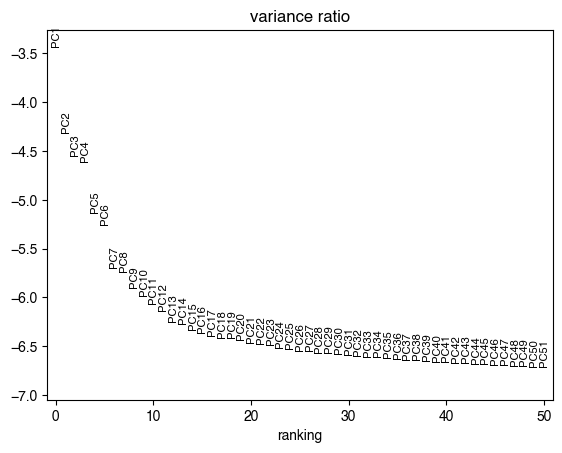

Knee of PCA at 9 PCs


In [20]:
# get num of PCs to use - by knee
sc.pl.pca_variance_ratio(adata_concat, n_pcs = 50, log=True)
num_pcs = get_knee_PCA(adata_concat, S=3)

print('Knee of PCA at '+str(num_pcs)+' PCs')

In [21]:
sc.pp.neighbors(adata_concat, n_neighbors=int(np.round(0.5*np.sqrt(np.shape(adata_concat.X)[0]))), 
                n_pcs=num_pcs, use_rep = 'X_pca_harmony')

sc.tl.umap(adata_concat)

computing neighbors
    finished (0:00:35)
computing UMAP
    finished (0:00:19)


### Look at structure

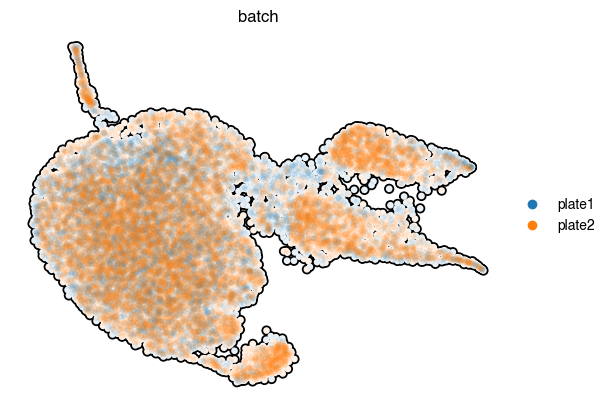

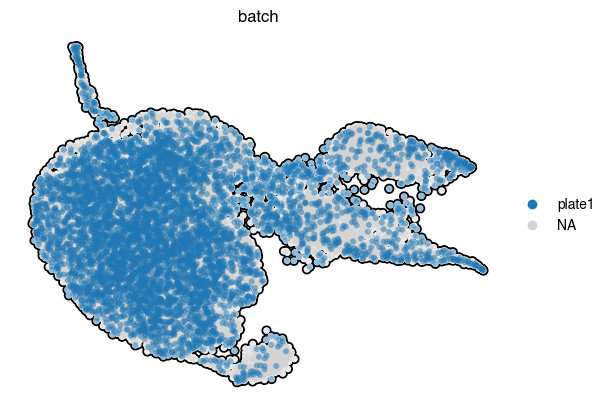

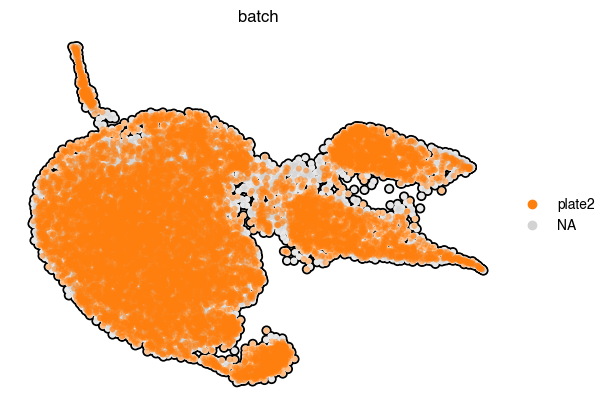

In [22]:
sc.pl.umap(adata_concat, color='batch', frameon=False, size=75, add_outline=True, alpha = 0.1,
           save = 'CS_Q1_Q2_UMAP_batch.pdf')
sc.pl.umap(adata_concat, color='batch', groups='plate1', frameon=False, size=75, add_outline=True, alpha = 0.5,
           save = 'CS_Q1_UMAP_batch.pdf')
sc.pl.umap(adata_concat, color='batch', groups='plate2', frameon=False, size=75, add_outline=True, alpha = 0.5,
           save = 'CS_Q2_UMAP_batch.pdf')

In [23]:
sc.tl.embedding_density(adata_concat, basis='umap', groupby='landmarks')

computing density on 'umap'


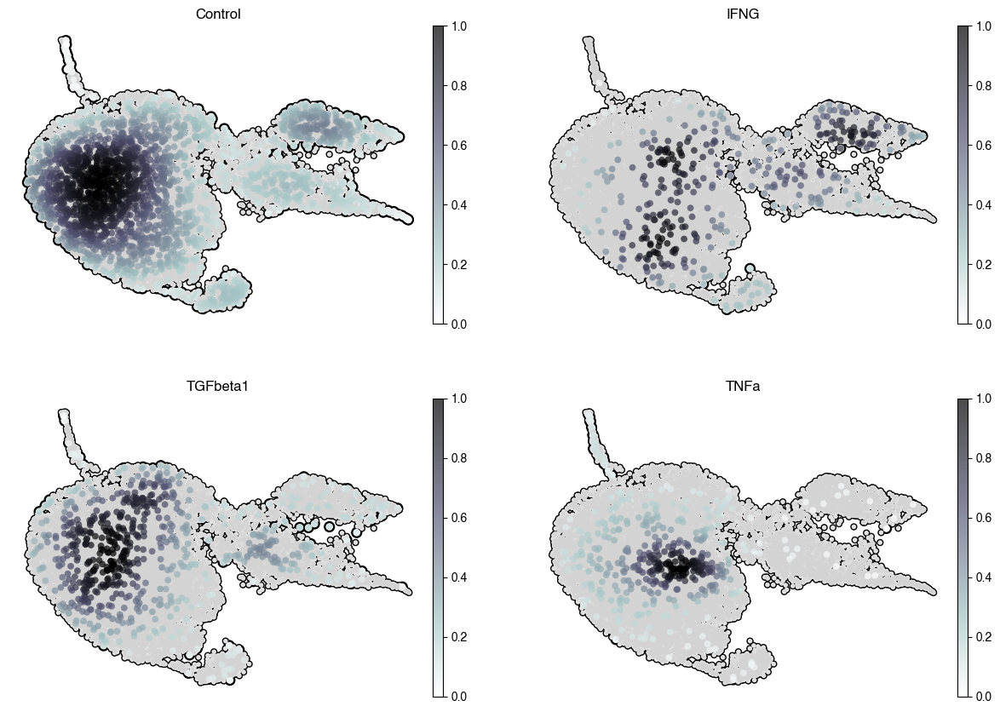

In [24]:
sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_landmarks', ncols = 2, 
                        bg_dotsize = 50, fg_dotsize = 125, add_outline = True,
                        color_map = 'bone_r',frameon=False,
                        save = 'CS_Q1Q2_UMAP_landmarks.pdf')

ranking genes
    finished (0:00:17)


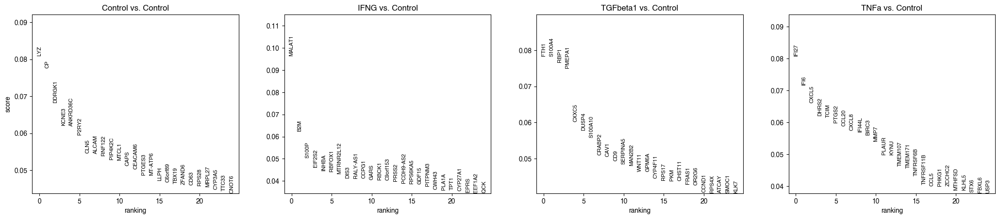

In [25]:
# get marker genes for landmarks
sc.tl.rank_genes_groups(adata_concat, groupby='landmarks', reference='Control', 
                        method='logreg', use_raw=False, max_iter= 10000)
sc.pl.rank_genes_groups(adata_concat, n_genes=25, sharey=False)

In [26]:
# module score all cells for landmark-defining genes

IFNG = get_knee_DE(adata_concat, 'IFNG', S=1)
sc.tl.score_genes(adata_concat, IFNG, score_name='lm_IFNG_score', ctrl_size=len(IFNG), use_raw = False)

TGFbeta1 = get_knee_DE(adata_concat, 'TGFbeta1', S=1)
sc.tl.score_genes(adata_concat, TGFbeta1, score_name='lm_TGFbeta1_score', ctrl_size=len(TGFbeta1), use_raw = False)

TNFa = get_knee_DE(adata_concat, 'TNFa', S=1)
sc.tl.score_genes(adata_concat, TNFa, score_name='lm_TNFa_score', ctrl_size=len(TNFa), use_raw = False)


computing score 'lm_IFNG_score'
    finished (0:00:03)
computing score 'lm_TGFbeta1_score'
    finished (0:00:02)
computing score 'lm_TNFa_score'
    finished (0:00:02)


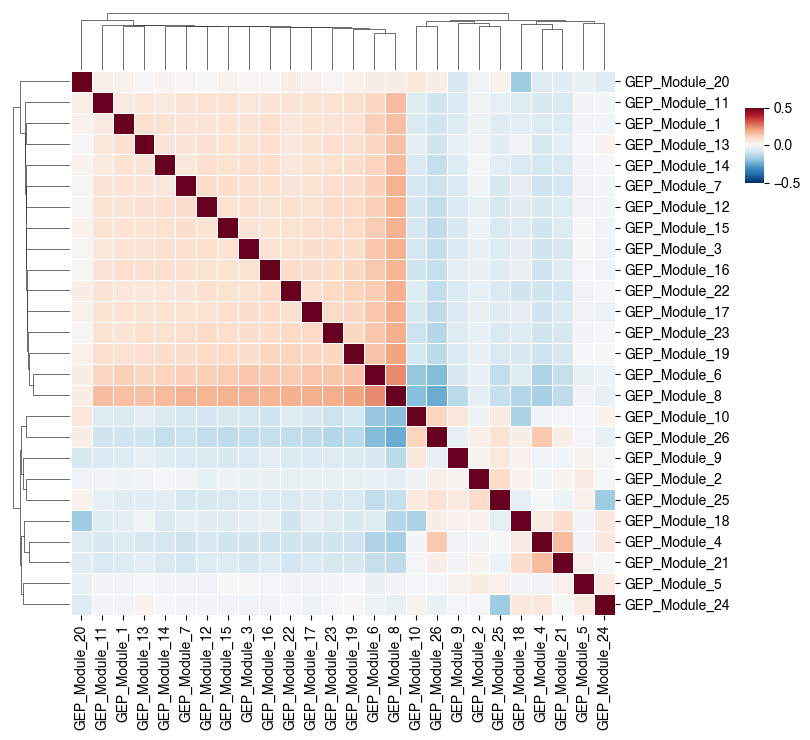

In [27]:
# Look at how modules overlap in cells

mods = list(adata_concat.obs.columns[adata_concat.obs.columns.str.startswith('GEP')])
GEP_table = adata_concat.obs[mods]

fig = sns.clustermap(GEP_table.corr(method='spearman'), cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize = (7.5,7.5),
                     dendrogram_ratio = 0.1, colors_ratio = 0.25, linewidths=.5,
                     cbar_pos=(1, 0.75, 0.025, 0.1))
fig.savefig('figures/GEP_corr_usages.pdf');

In [28]:
clustered_mods = list(GEP_table.iloc[:,fig.dendrogram_col.reordered_ind].columns)

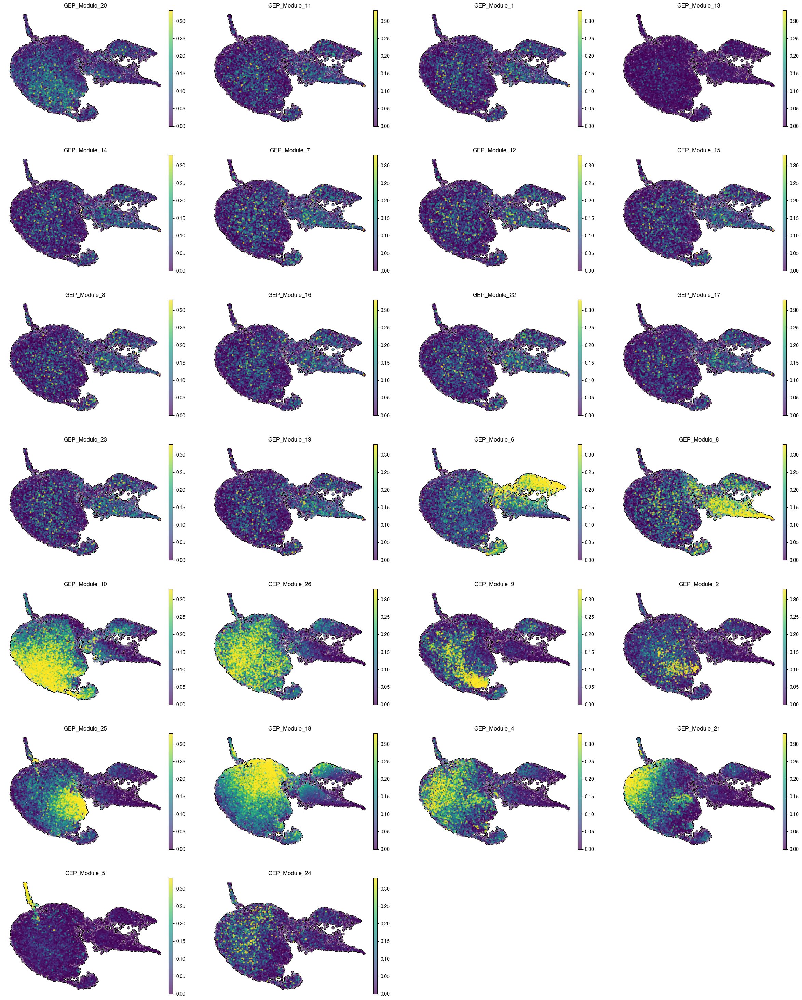

In [29]:
# Plot GEP activities
sc.pl.umap(adata_concat, color=clustered_mods, add_outline=True,
           vmax=0.33, vmin=0, ncols = 4, frameon=False, size=50,
           save = 'CS_Q1Q2_UMAP_GEPs.png')

In [30]:
# select most structured mods for decon / annotation
keep_GEP_mods = ['GEP_Module_20',
                 'GEP_Module_6',
                 'GEP_Module_8',
                 'GEP_Module_10',
                 'GEP_Module_26',
                 'GEP_Module_9',
                 'GEP_Module_2',
                 'GEP_Module_25',
                 'GEP_Module_18',
                 'GEP_Module_4',
                 'GEP_Module_21',
                 'GEP_Module_5',
                 'GEP_Module_24']

### Annotate modules - Run PROGENy, MSIGdb Hallmarks

In [31]:
# progeny
model = dc.get_progeny(organism='human', top=100)
dc.run_consensus(mat=adata_concat, net=model, 
                 min_n=15,
                 source='source', target='target', weight='weight', 
                 verbose=True, use_raw=False)

Running consensus.
Running mlm on mat with 16543 samples and 15876 targets for 14 sources.


100%|██████████| 2/2 [00:19<00:00,  9.98s/it]


Running ulm on mat with 16543 samples and 15876 targets for 14 sources.
Running wsum on mat with 16543 samples and 15876 targets for 14 sources.
Infering activities on 2 batches.


100%|██████████| 2/2 [03:21<00:00, 100.76s/it]


In [35]:
# MsigDB hallmark enrichments
msigdb = dc.get_resource('MSigDB')

# Filter by hallmark

# Try out running on everything rather than just hall marrk
# collections = ['hallmark','chemical_and_genetic_perturbations','reactome_pathways',
#  'kegg_pathways', 'biocarta_pathways','oncogenic_signatures',]

# msigdb = msigdb[msigdb.collection.isin(collections)]

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]

dc.run_ora(mat=adata_concat, net=msigdb,
           n_up=10, min_n=15,
           source='geneset', target='genesymbol',
           verbose=True, use_raw=False)

Running ora on mat with 16543 samples and 15876 targets for 13821 sources.


100%|██████████| 16543/16543 [07:58<00:00, 34.55it/s]


In [38]:
# correlate modules with Progeny + Hallmark + Cell cycle & PDAC modules

# get list of things to correl
GEPs = keep_GEP_mods
manual_mods = ['S_score','G2M_score',
               'percent.mt','percent.ribo',
               'nCount_RNA','nFeature_RNA',
               'mBasal','mClassical',
               'lm_IFNG_score','lm_TGFbeta1_score','lm_TNFa_score']

GEPs = adata_concat.obs.loc[:,adata_concat.obs.columns.isin(GEPs)]
manual_mods = adata_concat.obs.loc[:,adata_concat.obs.columns.isin(manual_mods)]
pathways = list(adata_concat.obsm['consensus_estimate'].columns)
genesets = list(adata_concat.obsm['ora_estimate'].columns)

combined_table = adata_concat.obsm['consensus_estimate'].merge(adata_concat.obsm['ora_estimate'], 
                                                         how='inner',left_index=True, right_index=True)
combined_table = GEPs.merge(combined_table, how='inner',left_index=True, right_index=True)
combined_table = manual_mods.merge(combined_table, how='inner',left_index=True, right_index=True)

# Create correl matricies
progeny_matrix = pd.DataFrame(np.zeros((len(GEPs.columns),len(pathways))),index=GEPs.columns,columns=pathways)
hallmark_matrix = pd.DataFrame(np.zeros((len(GEPs.columns),len(genesets))),index=GEPs.columns,columns=genesets)
mods_matrix = pd.DataFrame(np.zeros((len(GEPs.columns),len(manual_mods.columns))),index=GEPs.columns,columns=manual_mods.columns)

for GEP in GEPs.columns:
    corr_table = combined_table.loc[combined_table[GEP]>0,:]
    
    for pathway in pathways:
        # populate corr matrix
        corr = corr_table.loc[:,corr_table.columns.isin([GEP,pathway])].corr().iloc[0,1]
        progeny_matrix.loc[GEP,pathway] = corr

    for geneset in genesets:
        # populate corr matrix
        corr = corr_table.loc[:,corr_table.columns.isin([GEP,geneset])].corr().iloc[0,1]
        hallmark_matrix.loc[GEP,geneset] = corr
        
    for mod in manual_mods.columns:
        # populate corr matrix
        corr = corr_table.loc[:,corr_table.columns.isin([GEP,mod])].corr().iloc[0,1]
        mods_matrix.loc[GEP,mod] = corr
        
# Filter matricies
cor_cutoff = 0.15

# Select modules with peason r > cor_cutoff
keep_pathway = np.sum(abs(progeny_matrix) > cor_cutoff, axis=0) > 0
keep_geneset = np.sum(abs(hallmark_matrix) > cor_cutoff, axis=0) > 0
keep_mod = np.sum(abs(mods_matrix) > cor_cutoff, axis=0) > 0

filtered_progeny_matrix = progeny_matrix.loc[:, keep_pathway]
filtered_hallmark_matrix = hallmark_matrix.loc[:, keep_geneset]
filtered_mods_matrix = mods_matrix.loc[:, keep_mod]

filtered_matrix = pd.concat([filtered_progeny_matrix,filtered_hallmark_matrix,filtered_mods_matrix], axis=1)

In [61]:
filtered_matrix.loc['NFKB',:].sort_values(ascending=False).iloc[0:25]

lm_TNFa_score                                                             0.591758
NFkB                                                                      0.510064
TNFa                                                                      0.503514
LIANG_SILENCED_BY_METHYLATION_2                                           0.390650
MODULE_76                                                                 0.389053
BLANCO_MELO_COVID19_BRONCHIAL_EPITHELIAL_CELLS_SARS_COV_2_INFECTION_UP    0.375764
WONG_ENDMETRIUM_CANCER_UP                                                 0.364685
JINESH_BLEBBISHIELD_VS_LIVE_CONTROL_DN                                    0.362096
MODULE_263                                                                0.355160
MODULE_108                                                                0.353235
GSE36888_UNTREATED_VS_IL2_TREATED_STAT5_AB_KNOCKIN_TCELL_2H_UP            0.350198
REACTOME_CHEMOKINE_RECEPTORS_BIND_CHEMOKINES                              0.349728
GRAH

In [44]:
filtered_matrix.loc['wound healing',:].sort_values(ascending=False).iloc[0:25]

mBasal                                                      0.255273
MIR27A_5P                                                   0.237940
chr1q32                                                     0.213395
WANG_BARRETTS_ESOPHAGUS_AND_ESOPHAGUS_CANCER_DN             0.185186
chr18q21                                                    0.184671
BLANCO_MELO_COVID19_SARS_COV_2_INFECTION_A594_CELLS_UP      0.182965
MIR4296                                                     0.178656
DELPUECH_FOXO3_TARGETS_UP                                   0.175610
MODULE_286                                                  0.174719
BOSCO_ALLERGEN_INDUCED_TH2_ASSOCIATED_MODULE                0.174598
MODULE_327                                                  0.172463
CHIANG_LIVER_CANCER_SUBCLASS_INTERFERON_UP                  0.165110
GSE21670_UNTREATED_VS_TGFB_TREATED_STAT3_KO_CD4_TCELL_DN    0.165104
GSE2770_IL12_AND_TGFB_ACT_VS_ACT_CD4_TCELL_6H_DN            0.162526
MIR6847_5P                        

In [46]:
filtered_matrix.loc['Type I IFN',:].sort_values(ascending=False).iloc[0:25]

SEITZ_NEOPLASTIC_TRANSFORMATION_BY_8P_DELETION_UP                           0.843823
MOSERLE_IFNA_RESPONSE                                                       0.827505
QUEREC_PBMC_YF_17D_VACCINE_AGE_18_45YO_3DY_UP                               0.822005
QUEREC_PBMC_YF_17D_VACCINE_AGE_18_45YO_7DY_UP                               0.822005
BLANCO_MELO_HUMAN_PARAINFLUENZA_VIRUS_3_INFECTION_A594_CELLS_UP             0.820454
GSE42021_TREG_VS_TCONV_PLN_UP                                               0.819999
ERWIN_COHEN_BLOOD_VACCINE_TC_83_AGE_23_48YO_VACCINATED_VS_CONTROL_7DY_UP    0.813341
GSE22886_CTRL_VS_LPS_24H_DC_DN                                              0.812621
GSE18791_CTRL_VS_NEWCASTLE_VIRUS_DC_6H_DN                                   0.810235
GSE14000_UNSTIM_VS_4H_LPS_DC_TRANSLATED_RNA_DN                              0.809447
GSE37533_PPARG2_FOXP3_VS_FOXP3_TRANSDUCED_CD4_TCELL_DN                      0.808281
GSE42021_CD24INT_VS_CD24LOW_TREG_THYMUS_DN                       

In [60]:
filtered_matrix.loc['IFNgamma',:].sort_values(ascending=False).iloc[0:25]

lm_IFNG_score                                                                      0.475451
HANN_RESISTANCE_TO_BCL2_INHIBITOR_DN                                               0.447644
chr7q34                                                                            0.330320
REACTOME_ACTIVATION_OF_MATRIX_METALLOPROTEINASES                                   0.310929
GAZDA_DIAMOND_BLACKFAN_ANEMIA_PROGENITOR_DN                                        0.277530
REACTOME_COBALAMIN_CBL_VITAMIN_B12_TRANSPORT_AND_METABOLISM                        0.275262
CHANG_IMMORTALIZED_BY_HPV31_DN                                                     0.270076
DOANE_BREAST_CANCER_ESR1_UP                                                        0.260725
WANG_CISPLATIN_RESPONSE_AND_XPC_UP                                                 0.249669
HAN_SATB1_TARGETS_DN                                                               0.249511
JINESH_BLEBBISHIELD_TRANSFORMED_STEM_CELL_SPHERES_UP                            

In [59]:
filtered_matrix.loc['TGFbeta',:].sort_values(ascending=False).iloc[0:25]

lm_TGFbeta1_score                                           0.471091
REACTOME_DOWNREGULATION_OF_TGF_BETA_RECEPTOR_SIGNALING      0.340275
REACTOME_TGF_BETA_RECEPTOR_SIGNALING_ACTIVATES_SMADS        0.326444
KOINUMA_TARGETS_OF_SMAD2_OR_SMAD3                           0.307365
REACTOME_SIGNALING_BY_TGF_BETA_RECEPTOR_COMPLEX             0.297678
VERNELL_RETINOBLASTOMA_PATHWAY_DN                           0.276462
HALLMARK_TGF_BETA_SIGNALING                                 0.256126
NAKAMURA_TUMOR_ZONE_PERIPHERAL_VS_CENTRAL_UP                0.254131
AIGNER_ZEB1_TARGETS                                         0.251988
SWEET_KRAS_TARGETS_UP                                       0.246698
AMIT_EGF_RESPONSE_480_HELA                                  0.243419
KYNG_WERNER_SYNDROM_DN                                      0.239108
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION                  0.237959
REACTOME_SIGNALING_BY_TGFB_FAMILY_MEMBERS                   0.233196
BASAKI_YBX1_TARGETS_UP            

In [57]:
filtered_matrix

,JAK-STAT,MAPK,NFkB,TGFb,TNFa,Trail,VEGF,AAAYWAACM_HFH4_01,AACWWCAANK_UNKNOWN,AAGCACT_MIR520F,...,nFeature_RNA,percent.mt,percent.ribo,S_score,G2M_score,mBasal,mClassical,lm_IFNG_score,lm_TGFbeta1_score,lm_TNFa_score
NFKB,0.223625,-0.083684,0.510064,-0.132690,0.503514,-0.097602,-0.006693,-0.039734,-0.014058,-0.037536,...,0.117311,0.013281,-0.173929,-0.011471,-0.106679,-0.049004,0.078439,-0.020759,-0.079167,0.591758
wound healing,0.029080,0.079550,0.006791,-0.064964,-0.039906,-0.016692,0.060151,0.021903,-0.015253,-0.001284,...,0.007528,0.010065,-0.143615,-0.067309,-0.124321,0.255273,-0.110051,-0.003135,-0.014943,-0.046401
TGFbeta,-0.008540,0.125258,-0.074624,0.202149,-0.039865,-0.066791,-0.004006,-0.019541,-0.025878,-0.033444,...,-0.028431,-0.019601,0.018556,0.018540,-0.017546,0.163264,-0.156013,-0.085124,0.471091,-0.068199
IFNgamma,0.043633,0.082319,0.026335,-0.059503,0.062581,-0.024161,0.038586,-0.017412,-0.001184,-0.007532,...,-0.017037,-0.000806,-0.054724,-0.135746,-0.130410,0.165910,0.096624,0.475451,0.012276,0.092851
type I IFN,0.437090,-0.037887,0.013189,-0.075255,-0.033105,-0.057031,-0.017939,-0.007254,-0.020502,-0.034680,...,-0.012941,-0.079050,-0.071106,-0.000541,0.096414,-0.017098,-0.033994,-0.012910,0.001569,0.288214
classical,-0.058742,0.171245,0.017587,-0.059059,0.066234,-0.107128,0.068340,-0.032395,-0.033299,-0.030776,...,0.113891,-0.079477,-0.195955,0.011869,-0.101646,-0.007891,0.390783,-0.190253,-0.102885,0.011163
cell cycle G2M,-0.051218,0.012169,-0.065909,-0.012438,-0.074517,-0.052981,0.097547,-0.027938,-0.011405,-0.047669,...,0.122830,-0.137994,-0.109981,-0.034919,0.765257,-0.092932,-0.066421,-0.201597,-0.036883,-0.007012
cell cycle S phase,-0.077371,0.199478,0.024239,-0.012208,0.041862,-0.093135,0.048606,-0.009118,-0.001551,-0.031068,...,0.080419,-0.118958,-0.098334,0.645543,0.147572,-0.014578,-0.012215,-0.207810,0.054255,-0.006358
ribosomal,-0.069560,0.063055,-0.114919,0.103367,-0.090161,0.011042,0.087010,-0.006001,-0.016126,-0.042843,...,0.195992,-0.075927,0.663095,0.006405,-0.036975,0.041105,0.024739,-0.179633,0.235297,-0.087246
mitochondrial,-0.055871,0.076339,-0.017551,-0.037829,-0.043313,-0.054212,0.095203,0.006341,-0.002695,-0.021013,...,0.053442,0.280080,-0.318891,-0.088315,-0.116388,-0.087602,-0.143531,-0.113505,-0.129507,-0.071361


In [63]:
# Annotate modules!
cs_module_naming = {'GEP_Module_2':"IFNgamma",
                    'GEP_Module_4':"cell cycle S phase",
                    'GEP_Module_5':"type I IFN",
                    'GEP_Module_6':"low complexity 1",
                    'GEP_Module_8':"low complexity 2",
                    'GEP_Module_9':"wound healing",
                    'GEP_Module_10':"mitochondrial",
                    'GEP_Module_18':"ribosomal",
                    'GEP_Module_20':"low complexity 3",
                    'GEP_Module_21':"cell cycle G2M",
                    'GEP_Module_24':"TGFbeta",
                    'GEP_Module_25':"NFKB",
                    'GEP_Module_26':"classical"}

new_mod_order = ["NFKB",
                 "wound healing",
                 "TGFbeta",
                 "IFNgamma",
                 "type I IFN",
                 "classical",
                 "cell cycle G2M",
                 "cell cycle S phase",
                 "ribosomal",
                 "mitochondrial",
                 "low complexity 1",
                 "low complexity 2",
                 "low complexity 3"]

# Rename in adata
adata_concat.obs = adata_concat.obs.rename(columns=cs_module_naming)

# Rename in corr_matrix
filtered_matrix = filtered_matrix.rename(index=cs_module_naming)
filtered_matrix = filtered_matrix.reindex(index = new_mod_order)
filtered_matrix.to_csv("all_misgdb_filtered_matrix.csv")
# save adata
# adata_concat.write('h5ad_files/combined_plates_analyzed_step1_11_01_2022.h5ad')

In [74]:
['blah' in y for y in x]

[True, False]

In [99]:
filtered_matrix['HALLMARK_INTERFERON_GAMMA_RESPONSE']

NFKB                  0.127623
wound healing        -0.012180
TGFbeta               0.017120
IFNgamma              0.026167
type I IFN            0.781671
classical            -0.028406
cell cycle G2M        0.010047
cell cycle S phase   -0.028491
ribosomal            -0.028628
mitochondrial        -0.042696
low complexity 1     -0.057826
low complexity 2     -0.047912
low complexity 3     -0.014694
Name: HALLMARK_INTERFERON_GAMMA_RESPONSE, dtype: float64

In [98]:
use_bool = ['HALLMARK_IFN' in y for y in filtered_matrix.columns.values.tolist()]
filtered_matrix.columns.values[use_bool][20:]

array([], dtype=object)

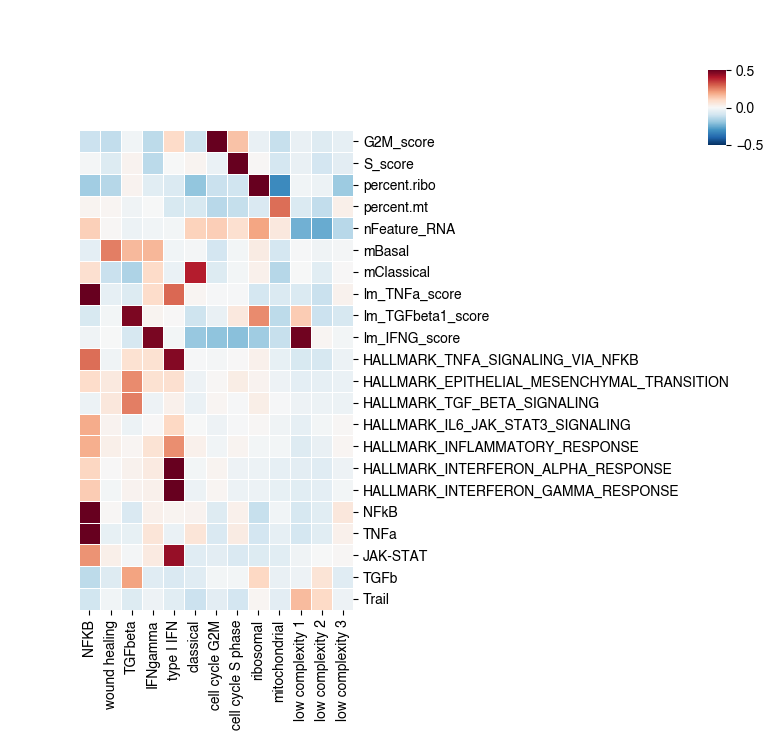

In [96]:
# make final plots
# fig = sns.clustermap(filtered_matrix.T, cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize = (7.5,10),
#                      method = 'weighted', dendrogram_ratio = 0.1, colors_ratio = 0.1, linewidths=.5,
#                      col_cluster=False, cbar_pos=(0.95, 0.8, 0.025, 0.1))
# fig.savefig('figures/GEP_corr_pathways.pdf');


selected_pathways = ['G2M_score',
                     'S_score',
                     
                     'percent.ribo',
                     'percent.mt',
                     'nFeature_RNA',
                     
                     'mBasal',
                     'mClassical',
                     
                     'lm_TNFa_score',
                     'lm_TGFbeta1_score',
                     'lm_IFNG_score',
                     
                     
                     'HALLMARK_TNFA_SIGNALING_VIA_NFKB',
                     'HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION',
                     'HALLMARK_TGF_BETA_SIGNALING',
                     'HALLMARK_IL6_JAK_STAT3_SIGNALING',
                     'HALLMARK_INFLAMMATORY_RESPONSE',
                     'HALLMARK_INTERFERON_ALPHA_RESPONSE',
                     'HALLMARK_INTERFERON_GAMMA_RESPONSE',
                     
                     'NFkB',
                     'TNFa',
                     'JAK-STAT',
                     'TGFb', 
                     'Trail']

fig = sns.clustermap(filtered_matrix[selected_pathways].T, cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize = (7.5,7.5),
                     colors_ratio = 0.1, linewidths=.5, cbar_pos=(0.95, 0.8, 0.025, 0.1),
                     col_cluster=False, row_cluster=False)
fig.savefig('figures/GEP_corr_select_pathways.pdf');

In [29]:
# filter + rename cNMF results

gene_scores = pd.read_csv('figures/p1_2_k_26_combined_knee_2_gene_scores.csv', index_col=0).add_prefix('GEP_')
normd_usages = pd.read_csv('figures/p1_2_k_26_combined_knee_2_normd_usages.csv', index_col=0).add_prefix('GEP_')
top_genes = pd.read_csv('figures/p1_2_k_26_combined_knee_2_top_genes.csv').add_prefix('GEP_')

# Filter to top mods
gene_scores = gene_scores[keep_GEP_mods]
normd_usages = normd_usages[keep_GEP_mods]
top_genes = top_genes[keep_GEP_mods]

# Rename in corr_matrix
gene_scores = gene_scores.rename(columns=cs_module_naming)
normd_usages = normd_usages.rename(columns=cs_module_naming)
top_genes = top_genes.rename(columns=cs_module_naming)

# Save
gene_scores.to_csv('figures/p1_2_k_26_combined_knee_2_gene_scores_filtered.csv')
normd_usages.to_csv('figures/p1_2_k_26_combined_knee_2_normd_usages_filtered.csv')
top_genes.to_csv('figures/p1_2_k_26_combined_knee_2_top_genes_filtered.csv', index=False)


In [30]:
# make heatmap of top usages

gene_scores = gene_scores.reindex(columns = new_mod_order)
top_genes = top_genes.reindex(columns = new_mod_order)

# get top 3 genes for each module
top_3_genes = []
for i in list(range(len(top_genes.columns))):
    top_3_genes.extend(top_genes.iloc[:3,i].values.tolist())
    
# filter gene scores
plot_gene_scores = gene_scores.loc[gene_scores.index.isin(top_3_genes),:]
plot_gene_scores = plot_gene_scores.reindex(index = top_3_genes)

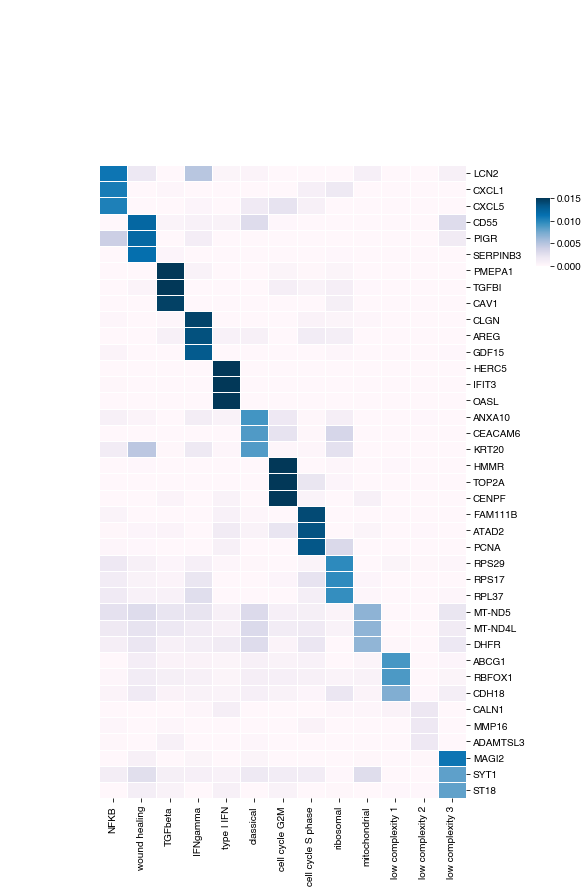

In [37]:
fig = sns.clustermap(plot_gene_scores, cmap="PuBu", vmin=0, vmax=0.015, linewidths=.5, figsize = (7.5,12.5),
                     colors_ratio = 0.1, col_cluster=False, row_cluster=False, cbar_pos=(1, 0.7, 0.025, 0.075))
fig.savefig('figures/GEP_gene_spectra_top_genes.pdf');

## Hit Finding

#### Run Decon - Top modules

In [83]:
decon_features = new_mod_order

p1_permute_model_coef, p1_pval_table, p1_model_coef = decon(adata_concat[adata_concat.obs.batch == 'plate1',:], decon_features,
                                                            p_cutoff=0.01, k="26",
                                                            num_shuff=100000,
                                                            save_prefix="csplate1+2_top_mods_p1_sept22")

p2_permute_model_coef, p2_pval_table, p2_model_coef = decon(adata_concat[adata_concat.obs.batch == 'plate2',:], decon_features,
                                                            p_cutoff=0.01, k="26",
                                                            num_shuff=100000,
                                                            save_prefix="csplate1+2_top_mods_p2_sept22")

starting shuffle test


done with shuffle
done!
starting shuffle test


done with shuffle
done!


#### Filter hits and plot effects

In [86]:
# Load decon results

p1_model_coef = pd.read_csv('decon_out/csplate1+2_top_mods_p1_sept22_k26_model_coef.csv', index_col=0)
p1_pval_table = pd.read_csv('decon_out/csplate1+2_top_mods_p1_sept22_k26_pval_table.csv', index_col=0)

p2_model_coef = pd.read_csv('decon_out/csplate1+2_top_mods_p2_sept22_k26_model_coef.csv', index_col=0)
p2_pval_table = pd.read_csv('decon_out/csplate1+2_top_mods_p2_sept22_k26_pval_table.csv', index_col=0)

# Set mod order + color
new_mod_order = ["NFKB",
                 "wound healing",
                 "TGFbeta",
                 "IFNgamma",
                 "type I IFN",
                 "classical",
                 "cell cycle G2M",
                 "cell cycle S phase",
                 "ribosomal",
                 "mitochondrial",
                 "low complexity 1",
                 "low complexity 2",
                 "low complexity 3"]

cs_color_map = {"NFKB":"#6c81d9",
                "wound healing":"#bb4554",
                "TGFbeta":"#8fb745",
                "IFNgamma":"#c972c4",
                "type I IFN":"#b1457b",
                "classical":"#5c398b",
                "cell cycle G2M":"#709243",
                "cell cycle S phase":"#4cc490",
                "ribosomal":"#b85e38",
                "mitochondrial":"#c59839",
                "low complexity 1":"lightgray",
                "low complexity 2":"darkgray",
               "low complexity 3":"dimgray"}

In [90]:
# Filter to p cutoff
p_cutoff = 0.01
p1_hits = p1_model_coef[(p1_pval_table<p_cutoff) & (p2_pval_table<p_cutoff)].dropna(axis=0, how='all')
p2_hits = p2_model_coef[(p1_pval_table<p_cutoff) & (p2_pval_table<p_cutoff)].dropna(axis=0, how='all')

# Filter to hits with the same sign (direction of effect)
same_sign = ((p1_hits >= 0) & (p1_hits >= 0)) | ((p1_hits < 0) & (p2_hits < 0))
p1_hits = p1_hits[same_sign].dropna(axis=0, how='all').dropna(axis=1, how='all').replace(np.nan, 0)
p2_hits = p2_hits[same_sign].dropna(axis=0, how='all').dropna(axis=1, how='all').replace(np.nan, 0)

# Turn hit table into adata
p1_hits = p1_hits.set_index('plate1_'+p1_hits.index.astype(str))
p2_hits = p2_hits.set_index('plate2_'+p2_hits.index.astype(str))

hit_table = pd.concat([p1_hits,p2_hits])
hit_table_meta = hit_table.reset_index()
hit_table_meta = hit_table_meta['index'].str.split("_", expand=True)
hit_table_meta.columns = ['plate','Metadata_perturbation']
hit_table_meta.index = hit_table.index
hit_table_meta['Max_phenotype'] = hit_table.apply('idxmax', axis=1).values

# make adata
hits = anndata.AnnData(hit_table)
hits.obs = hit_table_meta

In [91]:
#sort hits by mod_order
hit_mod_order = [ele for ele in new_mod_order if ele in list(hit_table.columns.values)]

hit_table['Metadata_perturbation'] = hit_table_meta['Metadata_perturbation']
hit_table = hit_table.groupby('Metadata_perturbation').mean()
hit_table['Max_phenotype'] = hit_table.apply('idxmax', axis=1).values

# order hits for each module
ordered_hits = []
for i in hit_mod_order:
    top_mod = list(hit_table.loc[hit_table.Max_phenotype==i].sort_values(i,ascending=False).index)
    ordered_hits.extend(top_mod)

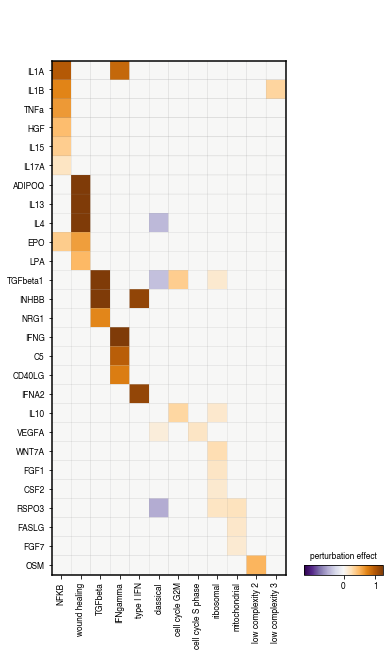

In [98]:
sc.pl.matrixplot(hits, hit_mod_order, 'Metadata_perturbation', categories_order=ordered_hits,
                 colorbar_title='perturbation effect', vmin=-0.5, vmax=1.25, vcenter=0, cmap='PuOr_r', 
                 save='CS_decon_hits_p<0_01.pdf')

In [265]:
# build merged hit table
merged_hit_table = pd.concat([p1_model_coef.stack(),
                              p2_model_coef.stack(),
                              p1_pval_table.stack(),
                              p2_pval_table.stack()],
                             axis=1).reset_index()
merged_hit_table.columns = ['ligand','module','p1_model_coef','p2_model_coef','p1_pval','p2_pval']

# define hit conditions
p_cutoff = 0.01
p_val_hit = (merged_hit_table.p1_pval<p_cutoff) & (merged_hit_table.p2_pval<p_cutoff)
same_sign = ((merged_hit_table.p1_model_coef>= 0) &\
             (merged_hit_table.p1_model_coef>=0)) |\
             ((merged_hit_table.p2_model_coef<0) &\
              (merged_hit_table.p2_model_coef<0))

# name hits
merged_hit_table['hits'] = 'ns'
merged_hit_table.loc[p_val_hit&same_sign,'hits'] = merged_hit_table.loc[p_val_hit&same_sign,'module']

merged_hit_table['hit_ligand'] = 'ns'
merged_hit_table.loc[p_val_hit&same_sign,'hit_ligand'] = merged_hit_table.loc[p_val_hit&same_sign,'ligand']

merged_hit_table['hits'] = merged_hit_table['hits'].astype("category")
merged_hit_table['hits'] = merged_hit_table['hits'].cat.set_categories(hit_mod_order+['ns'], ordered=True)

#update colormap
hit_plot_cmap = cs_color_map
hit_plot_cmap['ns'] = 'black'

# scale coef
merged_hit_table['p1_model_coef'] = np.abs(merged_hit_table['p1_model_coef'])/\
                                    np.max(merged_hit_table['p1_model_coef'])

merged_hit_table['p2_model_coef'] = np.abs(merged_hit_table['p2_model_coef'])/\
                                    np.max(merged_hit_table['p2_model_coef'])

# scale pvals
merged_hit_table['p1_pval'] = -np.log10(merged_hit_table['p1_pval']+(1e-6))
                                  
merged_hit_table['p2_pval'] = -np.log10(merged_hit_table['p2_pval']+(1e-6))

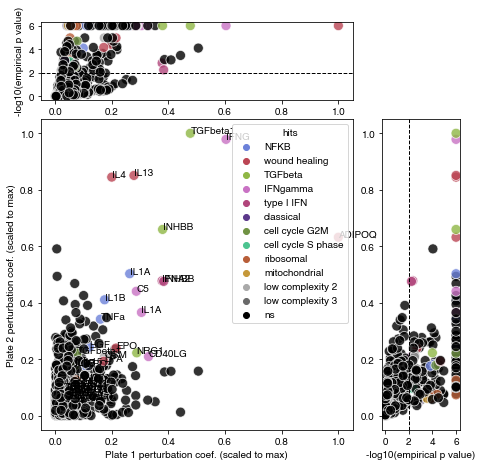

In [280]:
# Set up the matplotlib figure
fig = plt.figure()
 
# set height + width of each subplot as 8
fig.set_figheight(7.5)
fig.set_figwidth(7.5)
 
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=2,
                         width_ratios=[4, 1], wspace=0.15,
                         hspace=0.1, height_ratios=[1, 4])
 
# Plot each aspect
mod_plot = fig.add_subplot(spec[2])
sns.scatterplot(data=merged_hit_table, x="p1_model_coef", y="p2_model_coef", hue="hits",
                ax=mod_plot, s=100, alpha=0.8, 
                palette=hit_plot_cmap);

mod_plot.set_xlabel("Plate 1 perturbation coef. (scaled to max)")
mod_plot.set_ylabel("Plate 2 perturbation coef. (scaled to max)")

[mod_plot.text(x=row['p1_model_coef'], y=row['p2_model_coef'], s=row['hit_ligand'])\
 for k,row in merged_hit_table.iterrows() if not 'ns' in row.hit_ligand]
 
p1_pval = fig.add_subplot(spec[0])
sns.scatterplot(data=merged_hit_table, x="p1_model_coef", y="p1_pval", hue="hits",
                ax=p1_pval, s=100, alpha=0.8, 
                palette=hit_plot_cmap, legend=False);

p1_pval.set_ylabel("-log10(empirical p value)")
p1_pval.axhline(-np.log10(p_cutoff+(1e-6)), color="black", linestyle='--', linewidth=1)
p1_pval.yaxis.set_ticks([0,2,4,6])

p2_pval = fig.add_subplot(spec[3])
sns.scatterplot(data=merged_hit_table, y="p2_model_coef", x="p2_pval", hue="hits",
                ax=p2_pval, s=100, alpha=0.8, 
                palette=hit_plot_cmap,
                legend=False);


p2_pval.set_xlabel('-log10(empirical p value)')
p2_pval.axvline(-np.log10(p_cutoff+(1e-6)), color="black", linestyle='--', linewidth=1)
p2_pval.xaxis.set_ticks([0,2,4,6])

# display the plots
plt.savefig('figures/Hit_scatter_p<0_01.pdf');
plt.show()


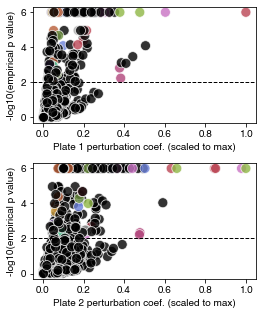

In [290]:
# Set up the matplotlib figure
fig = plt.figure()
 
# set height + width of each subplot as 8
fig.set_figheight(5)
fig.set_figwidth(4)
 
# create grid for different subplots
spec = gridspec.GridSpec(ncols=1, nrows=2,
                         hspace=0.35, height_ratios=[1, 1])
 
# Plot each aspect
p1_pval = fig.add_subplot(spec[0])
sns.scatterplot(data=merged_hit_table, x="p1_model_coef", y="p1_pval", hue="hits",
                ax=p1_pval, s=100, alpha=0.8, 
                palette=hit_plot_cmap, legend=False);

p1_pval.set_ylabel("-log10(empirical p value)")
p1_pval.set_xlabel("Plate 1 perturbation coef. (scaled to max)")
p1_pval.axhline(-np.log10(p_cutoff+(1e-6)), color="black", linestyle='--', linewidth=1)
p1_pval.yaxis.set_ticks([0,2,4,6])

p2_pval = fig.add_subplot(spec[1])
sns.scatterplot(data=merged_hit_table, x="p2_model_coef", y="p2_pval", hue="hits",
                ax=p2_pval, s=100, alpha=0.8, 
                palette=hit_plot_cmap,
                legend=False);


p2_pval.set_ylabel('-log10(empirical p value)')
p2_pval.set_xlabel("Plate 2 perturbation coef. (scaled to max)")
p2_pval.axhline(-np.log10(p_cutoff+(1e-6)), color="black", linestyle='--', linewidth=1)
p2_pval.yaxis.set_ticks([0,2,4,6])

# display the plots
plt.savefig('figures/Hit_p_val_p<0_01.pdf');
plt.show()

#### Map back to Object for a few hits

In [534]:
# Load adata
adata_concat = anndata.read('h5ad_files/combined_plates_analyzed_step1_9_22_2022.h5ad')

In [558]:
sc.set_figure_params(scanpy=True, dpi_save=300, frameon=False, 
                     fontsize=6, figsize=[3,2], transparent=True)

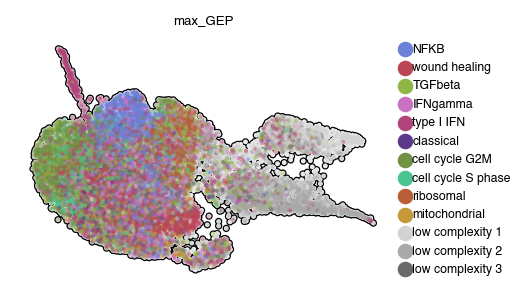

In [559]:
# Make UMAP colored by max module

mods = list(adata_concat.obs.columns[adata_concat.obs.columns.isin(new_mod_order)])

adata_mods = module_robust_scaler(adata_concat,mods)
GEP_table = adata_mods.obs[mods]
del adata_mods
adata_concat = anndata.read('h5ad_files/combined_plates_analyzed_step1_9_22_2022.h5ad')


adata_concat.obs['max_GEP'] = GEP_table.apply('idxmax', axis=1).values
adata_concat.obs['max_GEP'] = adata_concat.obs['max_GEP'].astype("category")
adata_concat.obs['max_GEP'] = adata_concat.obs['max_GEP'].cat.set_categories(new_mod_order, ordered=True)

sc.pl.umap(adata_concat, color=['max_GEP'], add_outline=True, alpha = 0.5,
               frameon=False, size=15, palette = cs_color_map, na_color = 'white',
               save = 'CS_Q1Q2_UMAP_max_GEP_.pdf')

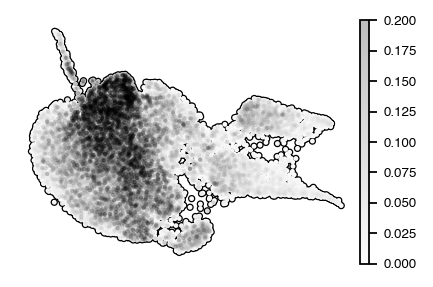

In [560]:
# Plot GEP activities

sc.pl.umap(adata_concat, color=['NFKB'], add_outline=True,
           vmax=0.2, vmin=0, frameon=False, size=15, alpha=0.25,
           title="", 
           color_map=sns.light_palette('black',as_cmap=True),
           save = 'CS_Q1Q2_UMAP_COLORBAR.pdf')

for mod in mods:
    sc.pl.umap(adata_concat, color=['max_GEP'], groups=[mod], add_outline=True, alpha = 0.5,
               frameon=False, size=15, palette = cs_color_map, na_color = 'white', legend_loc=None,
               title='',
               show=False, save = 'CS_Q1Q2_UMAP_max_GEP_'+mod+'.png');
    
    sc.pl.umap(adata_concat, color=[mod], add_outline=True,
           vmax=0.2, vmin=0, frameon=False, size=15, alpha = 0.25,
           title="", colorbar_loc=None, show=False,
           color_map=sns.light_palette(cs_color_map[mod],as_cmap=True),
           save = 'CS_Q1Q2_UMAP_'+mod+'.png')

#### Density plots

In [562]:
# Function for density mapping of pooled perturbation

def density_map_pert(adata, pert_group, pert_names):
    
    # Create metadata col for perturbations
    adata_concat.obs[pert_group] = np.nan
    
    for pert_name in pert_names:
        perturb_col = adata.uns['design_matrix_perturbations']==pert_name
        perturb_cells = list(adata.obsm['design_matrix'].astype(bool)[:,perturb_col].flatten())
        adata_concat.obs.loc[perturb_cells,pert_group] = pert_name
    
    
    # Run embedding density
    sc.tl.embedding_density(adata, basis='umap', groupby=pert_group)
    

##### NFKB hits

In [563]:
density_map_pert(adata_concat, 
                 pert_group = 'NFKB_hits', 
                 pert_names=['IL1A','IL1B','TNFa'])

computing density on 'umap'


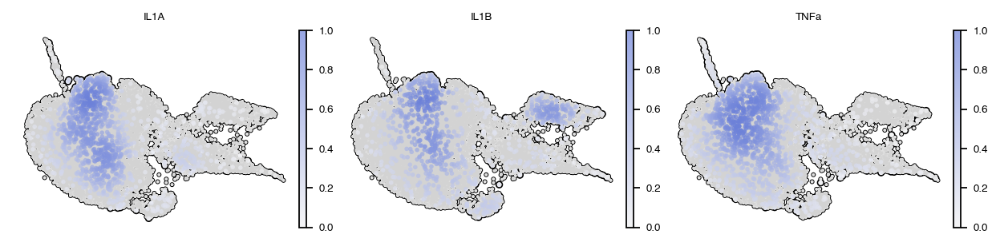

[<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>]

In [586]:
sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_NFKB_hits', ncols = 3, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['NFKB'],as_cmap=True),
                        frameon=False, wspace = 0.05)

sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_NFKB_hits', ncols = 3, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['NFKB'],as_cmap=True),
                        frameon=False, wspace = 0.05, 
                        title="", colorbar_loc=None,show=False,
                        save = 'CS_Q1Q2_UMAP_NFKB_hits_no_label.png')

##### wouud healing hits

In [565]:
density_map_pert(adata_concat, 
                 pert_group = 'wound_healing_hits', 
                 pert_names=['ADIPOQ','IL13','IL4'])

computing density on 'umap'


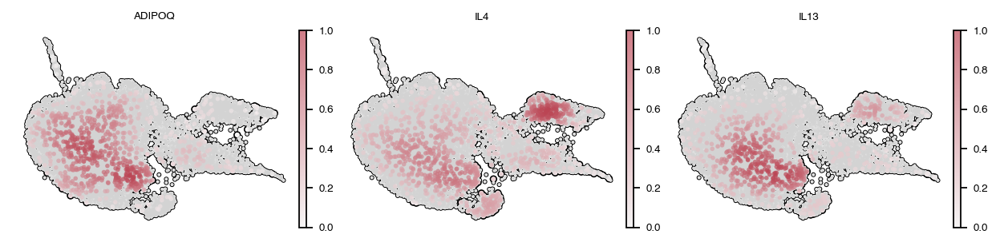

[<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>]

In [587]:
sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_wound_healing_hits', ncols = 3, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['wound healing'],as_cmap=True),
                        frameon=False, wspace = 0.05)

sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_wound_healing_hits', ncols = 3, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['wound healing'],as_cmap=True),
                        frameon=False, wspace = 0.05, 
                        title="", colorbar_loc=None,show=False,
                        save = 'CS_Q1Q2_UMAP_wound_healing_hits.png')

##### TGF beta hits

In [568]:
density_map_pert(adata_concat, 
                 pert_group = 'TGFb_hits', 
                 pert_names=['TGFbeta1','INHBB'])

computing density on 'umap'


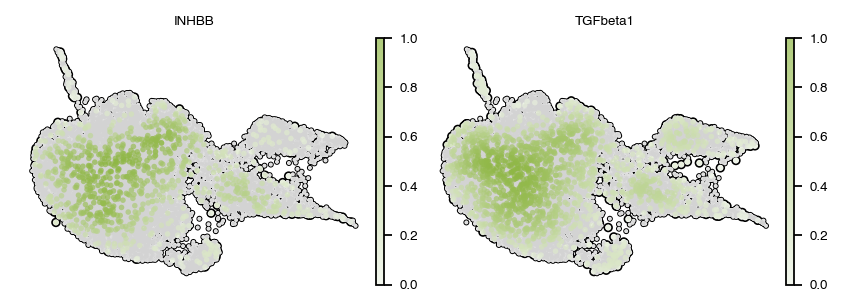

[<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>]

In [588]:
sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_TGFb_hits', ncols = 2, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['TGFbeta'],as_cmap=True),
                        frameon=False, wspace = 0.05)

sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_TGFb_hits', ncols = 2, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['TGFbeta'],as_cmap=True),
                        frameon=False, wspace = 0.05, 
                        title="", colorbar_loc=None,show=False,
                        save = 'CS_Q1Q2_UMAP_TGFb_hits.png')

##### Type I IFN

In [570]:
density_map_pert(adata_concat, 
                 pert_group = 'TI_IFN_hits', 
                 pert_names=['INHBB','IFNA2'])

computing density on 'umap'


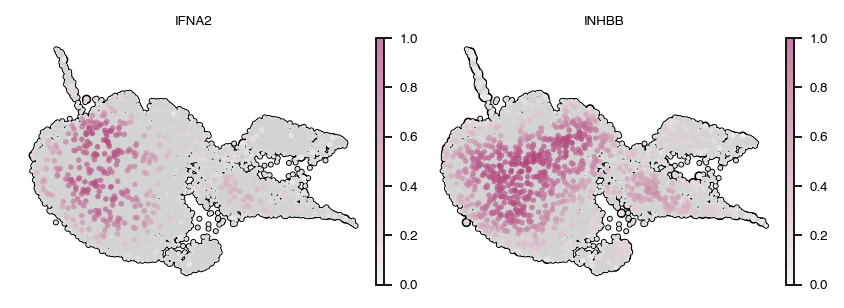

[<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>]

In [589]:
sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_TI_IFN_hits', ncols = 2, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['type I IFN'],as_cmap=True),
                        frameon=False, wspace = 0.05)

sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_TI_IFN_hits', ncols = 2, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['type I IFN'],as_cmap=True),
                        frameon=False, wspace = 0.05, 
                        title="", colorbar_loc=None, show=False,
                        save = 'CS_Q1Q2_UMAP_TI_IFN_hits.png')

##### IFNG hits

In [572]:
density_map_pert(adata_concat, 
                 pert_group = 'IFNgamma_hits', 
                 pert_names=['IL1A','IFNG'])

computing density on 'umap'


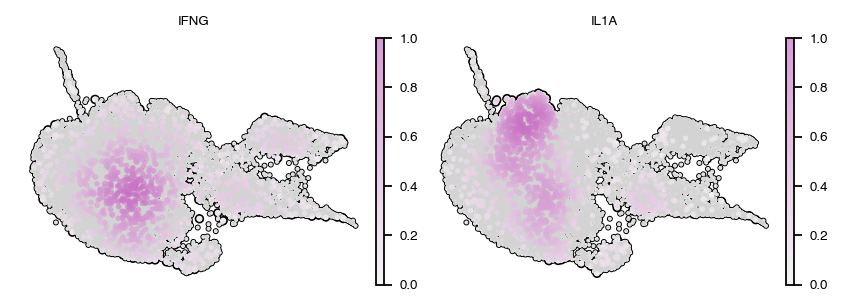

[<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>]

In [590]:
sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_IFNgamma_hits', ncols = 2, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['IFNgamma'],as_cmap=True),
                        frameon=False, wspace = 0.05)

sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_IFNgamma_hits', ncols = 2, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['IFNgamma'],as_cmap=True),
                        frameon=False, wspace = 0.05, 
                        title="", colorbar_loc=None,show=False,
                        save = 'CS_Q1Q2_UMAP_IFNgamma_hits.png')

##### ribosomal hits

In [574]:
density_map_pert(adata_concat, 
                 pert_group = 'ribosomal_hits', 
                 pert_names=['WNT7A','RSPO3'])

computing density on 'umap'


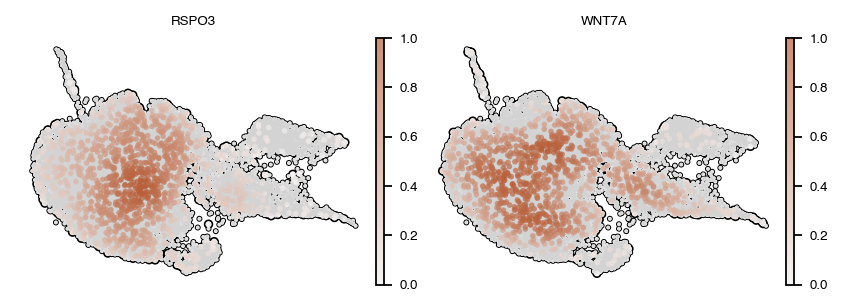

[<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>]

In [591]:
sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_ribosomal_hits', ncols = 2, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['ribosomal'],as_cmap=True),
                        frameon=False, wspace = 0.05)

sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_ribosomal_hits', ncols = 2, 
                        bg_dotsize = 10, fg_dotsize = 25, add_outline = True,
                        color_map = sns.light_palette(cs_color_map['ribosomal'],as_cmap=True),
                        frameon=False, wspace = 0.05, 
                        title="", colorbar_loc=None,show=False,
                        save = 'CS_Q1Q2_UMAP_ribosomal_hits.png')

##### Final QC plots

In [497]:
adata_concat.var['mito'] = adata_concat.var_names.str.startswith('MT-')
adata_concat.var['ribo'] = adata_concat.var_names.str.startswith('RP')

In [498]:
sc.pp.calculate_qc_metrics(adata_concat, qc_vars=('mito','ribo'), layer='raw', inplace=True)

In [499]:
cols = ['sample_well','TGFbeta1','IFNG','TNFa','Control']

np.sum(adata_concat.obs.loc[adata_concat.obs.batch=='plate1',
                            adata_concat.obs.columns.isin(cols)].groupby('sample_well').count()>0,axis=0)

TGFbeta1     4
IFNG         4
TNFa         4
Control     12
dtype: int64

In [500]:
np.sum(adata_concat.obs.loc[adata_concat.obs.batch=='plate2',
                            adata_concat.obs.columns.isin(cols)].groupby('sample_well').count()>0,axis=0)

TGFbeta1     4
IFNG         4
TNFa         4
Control     12
dtype: int64

In [501]:
adata_concat.obs[['batch','Metadata_perturbation','TGFbeta1','IFNG','TNFa','Control']].groupby('batch').count()

,Metadata_perturbation,TGFbeta1,IFNG,TNFa,Control
batch,,,,,
plate1,5662,203,168,239,715
plate2,10881,484,198,201,1493


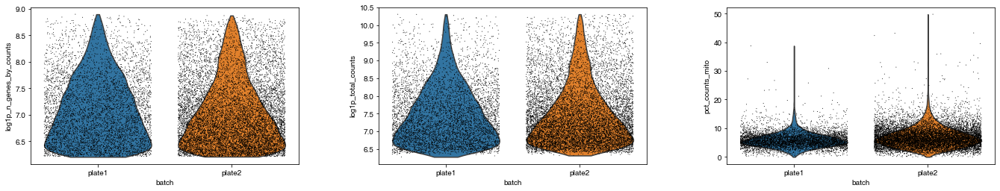

In [502]:
sc.pl.violin(adata_concat, groupby='batch', keys=['log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_mito'],
             jitter=0.4, multi_panel=True, save='figures/QC_plots.pdf')